# Clustering Match Data

In this notebook, we will explore the use of unsupervised clustering models to detect patterns in our data that signify whether a match was balanced or not. Unsupervised clustering is a powerful technique for discovering underlying structures in data without the need for labelled outcomes. By applying this approach, we aim to uncover distinct groupings or clusters within the dataset that could reveal valuable insights into the balance or imbalance of matches. This exploration will involve a detailed overview of unsupervised clustering methods, the selection of appropriate algorithms, the preprocessing of data, and the interpretation of results. By the end of this introduction, you will have a solid understanding of how unsupervised clustering can be leveraged to identify patterns related to match balance.

## Initial Setup

In [1]:
# ---------------- Basic Data Science Libraries ---------------- #
import numpy as np # Linear algebra
import pandas as pd # Data processing

# ---------------- System Libraries ---------------- #
import os # Miscellaneous operating system interfaces
import gc # Garbage collector interface
import nbimporter # Use functions from other Jupyter Notebooks'
from Data_Cleaning_and_Exploration import is_integer_series
from subprocess import check_output # Saves results written to the current directory as output

# ---------------- Plotting Libraries ---------------- #
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
%matplotlib inline
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

# ---------------- SKlearn Library ---------------- #
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, QuantileTransformer, StandardScaler

# ---------------- Define Clean and Raw Directories ---------------- #
clean_folder = '../Data/Clean'
raw_folder = '../Data/Raw'
merged_folder = '../Data/Merged'

# ---------------- Set new DataFrame limiters ---------------- #
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

# ---------------- Print files in my clean data folder ---------------- #
print(check_output(['ls', merged_folder]).decode('utf8'))

final_df.csv
matches.csv
players.csv
timeseries.csv



In [2]:
# Load the data
matches = pd.read_csv(merged_folder + '/matches.csv', index_col='match_id')
print(f'matches:', '{:,} observations, {:,} features'.format(matches.shape[0], matches.shape[1]))
print('----------------------------')

display(matches.head())

matches: 49,931 observations, 30 features
----------------------------


,start_time,duration,tower_status_radiant,tower_status_dire,barracks_status_dire,barracks_status_radiant,first_blood_time,game_mode,radiant_win,cluster,team_kda_dire,team_kda_radiant,team_denies_dire,team_denies_radiant,team_gold_dire,team_gold_radiant,team_gold_spent_dire,team_gold_spent_radiant,hero_slot_0,hero_slot_1,hero_slot_2,hero_slot_3,hero_slot_4,hero_slot_128,hero_slot_129,hero_slot_130,hero_slot_131,hero_slot_132,teamfights,tf_avg_duration
match_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2015-11-05 19:01:52,2375,1982,4,3,63,1,22,1,155,0.923077,8.058824,38,30,3718,10811,58620,87245,86,51,83,11,67,106,102,46,7,73,12.0,42.583333
1,2015-11-05 19:51:18,2582,0,1846,63,0,221,22,0,154,3.594595,1.584906,16,27,9085,4776,107750,69310,7,82,71,39,21,73,22,5,67,106,15.0,44.066667
2,2015-11-05 23:03:06,2716,256,1972,63,48,190,22,0,132,6.272727,1.081633,16,10,11177,2494,81620,54990,51,109,9,41,27,38,7,10,12,85,11.0,45.272727
3,2015-11-05 23:22:03,3085,4,1924,51,3,40,22,0,191,2.661538,2.363636,29,32,5954,6455,94430,76685,50,44,32,26,39,78,19,31,40,47,16.0,52.062500
4,2015-11-06 07:53:05,1887,2047,0,0,63,58,22,1,156,1.243243,6.000000,21,26,2030,14099,38980,78980,8,39,55,87,69,101,100,22,67,21,6.0,42.666667


## Preprocessing

Before we start exploring the data through exploratory data analysis (EDA), we need to conduct a quick sanity check to address any missing or duplicated rows that may have been overlooked in the previous notebooks. Additionally, we should handle the formatting of datetime and categorical data.

In [3]:
# Check for null values
matches.isna().sum()

start_time                 0
duration                   0
tower_status_radiant       0
tower_status_dire          0
barracks_status_dire       0
barracks_status_radiant    0
first_blood_time           0
game_mode                  0
radiant_win                0
cluster                    0
team_kda_dire              0
team_kda_radiant           0
team_denies_dire           0
team_denies_radiant        0
team_gold_dire             0
team_gold_radiant          0
team_gold_spent_dire       0
team_gold_spent_radiant    0
hero_slot_0                0
hero_slot_1                0
hero_slot_2                0
hero_slot_3                0
hero_slot_4                0
hero_slot_128              0
hero_slot_129              0
hero_slot_130              0
hero_slot_131              0
hero_slot_132              0
teamfights                 0
tf_avg_duration            0
dtype: int64

In [4]:
# Check for duplicated rows
matches.duplicated().sum()

0

In [5]:
# Look at the DataFrame info
matches.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49931 entries, 0 to 49999
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   start_time               49931 non-null  object 
 1   duration                 49931 non-null  int64  
 2   tower_status_radiant     49931 non-null  int64  
 3   tower_status_dire        49931 non-null  int64  
 4   barracks_status_dire     49931 non-null  int64  
 5   barracks_status_radiant  49931 non-null  int64  
 6   first_blood_time         49931 non-null  int64  
 7   game_mode                49931 non-null  int64  
 8   radiant_win              49931 non-null  int64  
 9   cluster                  49931 non-null  int64  
 10  team_kda_dire            49931 non-null  float64
 11  team_kda_radiant         49931 non-null  float64
 12  team_denies_dire         49931 non-null  int64  
 13  team_denies_radiant      49931 non-null  int64  
 14  team_gold_dire           49

In [6]:
# Get all the columns that may have true float values
float_columns = matches.select_dtypes(include='float').columns

for col in float_columns:
    if is_integer_series(matches[col]):
        matches[col] = matches[col].astype(np.int64)
    else:
        print(f'{col} holds real float numbers')

# Sanity check
matches.select_dtypes(include='float').columns

team_kda_dire holds real float numbers
team_kda_radiant holds real float numbers
tf_avg_duration holds real float numbers


Index(['team_kda_dire', 'team_kda_radiant', 'tf_avg_duration'], dtype='object')

In [7]:
# Define categorical columns
cat_features = ['game_mode', 'radiant_win', 'cluster', 
                'hero_slot_0','hero_slot_1', 'hero_slot_2', 
                'hero_slot_3', 'hero_slot_4', 'hero_slot_128', 
                'hero_slot_129', 'hero_slot_130', 'hero_slot_131', 
                'hero_slot_132']

matches[cat_features] = matches[cat_features].astype('category')

# Drop the start_time since we have duration
matches.drop(columns=['start_time'], inplace=True)

# Sanity check
matches.dtypes

duration                      int64
tower_status_radiant          int64
tower_status_dire             int64
barracks_status_dire          int64
barracks_status_radiant       int64
first_blood_time              int64
game_mode                  category
radiant_win                category
cluster                    category
team_kda_dire               float64
team_kda_radiant            float64
team_denies_dire              int64
team_denies_radiant           int64
team_gold_dire                int64
team_gold_radiant             int64
team_gold_spent_dire          int64
team_gold_spent_radiant       int64
hero_slot_0                category
hero_slot_1                category
hero_slot_2                category
hero_slot_3                category
hero_slot_4                category
hero_slot_128              category
hero_slot_129              category
hero_slot_130              category
hero_slot_131              category
hero_slot_132              category
teamfights                  

In [8]:
# Basic Statistical Analysis
matches.describe()

,duration,tower_status_radiant,tower_status_dire,barracks_status_dire,barracks_status_radiant,first_blood_time,team_kda_dire,team_kda_radiant,team_denies_dire,team_denies_radiant,team_gold_dire,team_gold_radiant,team_gold_spent_dire,team_gold_spent_radiant,teamfights,tf_avg_duration
count,49931.000000,49931.000000,49931.000000,49931.00000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000,49931.000000
mean,2478.826340,999.066111,934.250586,34.50035,34.744928,93.845286,3.009328,3.114389,26.069576,25.314033,9412.747872,9485.127416,70547.030803,70697.479021,10.795838,46.133280
std,631.588021,948.135904,937.833671,29.21166,29.735389,92.662947,2.384734,2.549649,13.044832,12.669249,6184.416790,5792.759123,23101.381776,20913.817122,3.926484,3.308766
min,214.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000,83.000000,4650.000000,5095.000000,1.000000,31.000000
25%,2030.000000,0.000000,0.000000,0.00000,0.000000,9.000000,1.562500,1.611111,17.000000,16.000000,4271.000000,4657.000000,53522.500000,56315.000000,8.000000,44.000000
50%,2416.000000,1536.000000,384.000000,51.00000,51.000000,77.000000,2.500000,2.546875,24.000000,24.000000,7848.000000,8381.000000,71490.000000,70985.000000,11.000000,46.000000
75%,2873.000000,1974.000000,1972.000000,63.00000,63.000000,144.000000,3.842105,3.916667,34.000000,33.000000,13666.000000,13405.000000,86705.000000,84622.500000,13.000000,48.151923
max,16037.000000,2047.000000,2047.000000,63.00000,63.000000,831.000000,142.000000,85.000000,143.000000,118.000000,106931.000000,41170.000000,397895.000000,319890.000000,40.000000,70.000000


##### Key Insights:
- The average match duration is around 41.31 minutes, with a standard deviation of approximately 10.53 minutes. The shortest match lasted about 3.57 minutes, while the longest was approximately 267.28 minutes.
- Most metrics, such as tower and barracks status, KDA, denies, and gold, are evenly balanced between the Radiant and Dire teams, potentially indicating relatively evenly matched matches.
- The time of first blood varies widely, which can impact the early game momentum and strategy.
- On average, there are about 11 team fights per match, each lasting around 46 seconds, which are crucial moments in the game.

Let's separate the numerical features for EDA purposes:

In [9]:
# Define numerical columns
num_features = matches.drop(columns=cat_features)

Now, we can take a 25% sample to improve computation efficiency.

In [10]:
sample_df = num_features.sample(frac=0.25, random_state=42)
sample_df.shape

(12483, 16)

## EDA

We are now prepared to conduct exploratory analysis on our preprocessed dataset. This will involve examining the distribution of our categorical variables and creating histograms for the numerical variables.

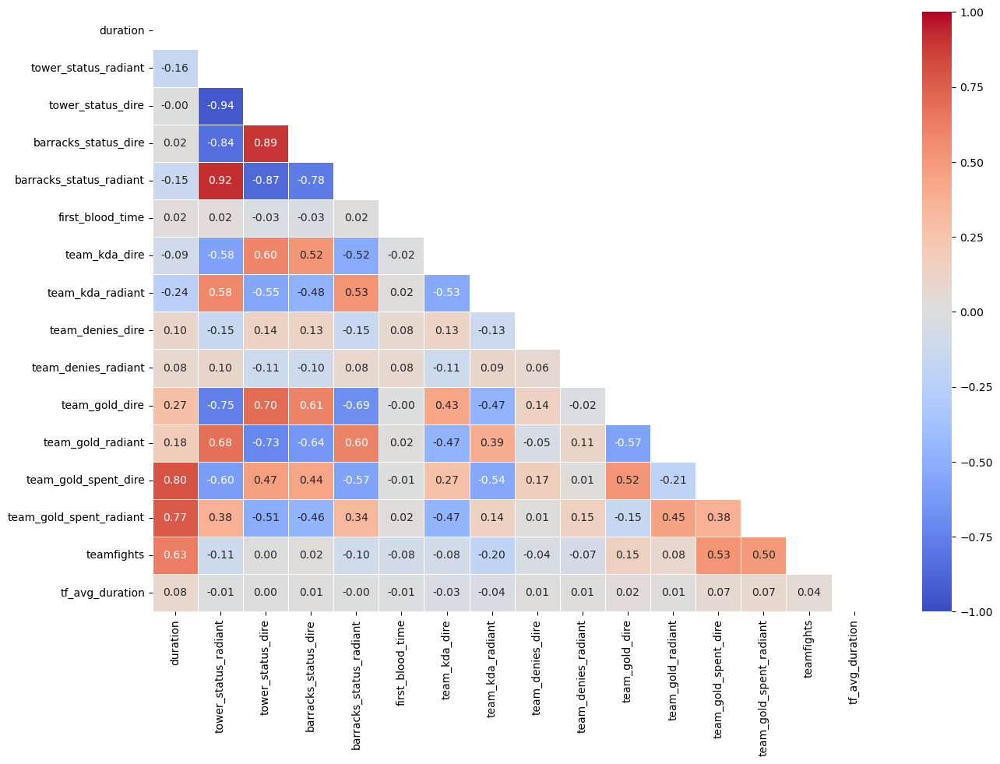

In [11]:
# Visualize the correlation between all the numerical features
corr_matrix = sample_df.corr()
mask = np.triu(corr_matrix)

plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, vmax=1, vmin=-1, cmap='coolwarm', annot=True, fmt='.2f', mask=mask, linewidths=0.5)
plt.show()

<div class="alert alert-block alert-info">
<b>Note:</b> <i>Upon reviewing the matrix provided, it is evident that there are numerous features exhibiting a high degree of correlation with each other</i>.</div>

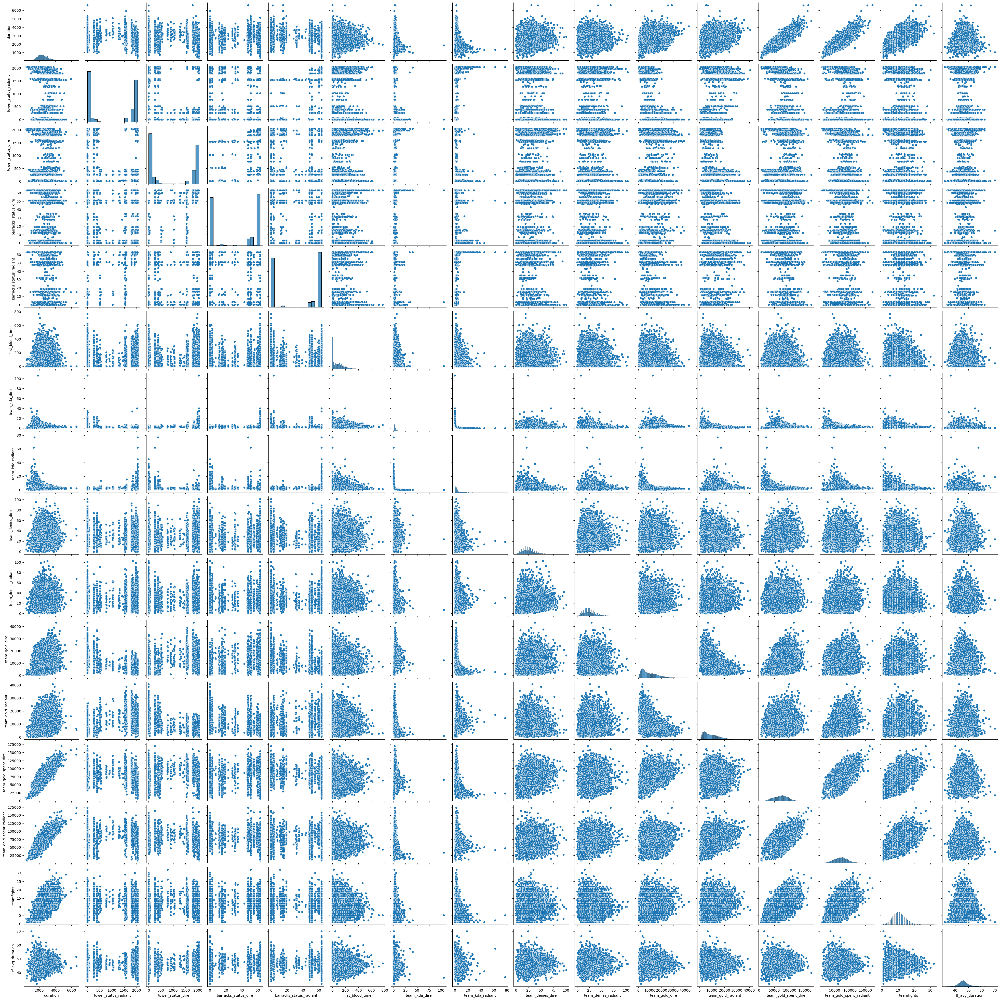

In [12]:
# Pair plot to investigate the correlation between the features
sns.pairplot(sample_df)
plt.show()

<div class="alert alert-block alert-info">
<b>Note:</b> <i>We observe certain features that demonstrate a linear relationship, such as teams spending more gold in longer matches.</i>.</div>

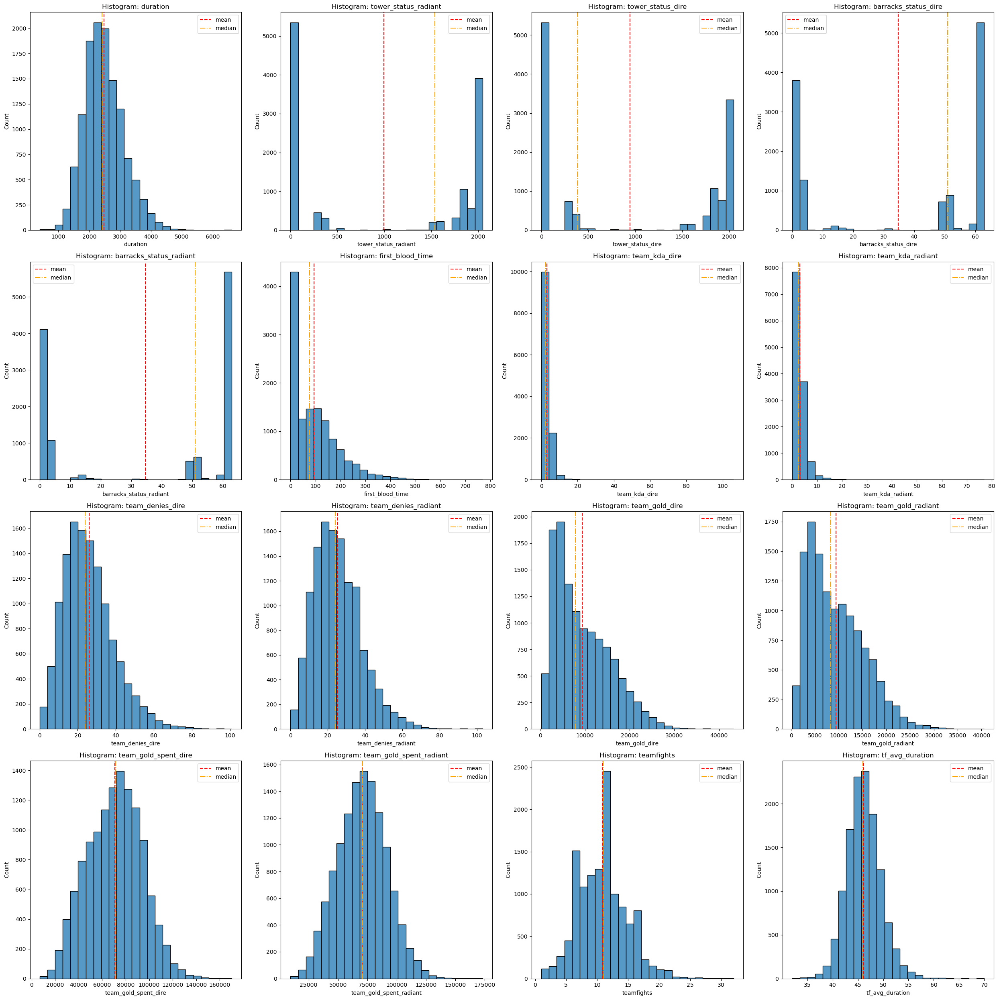

In [13]:
plt.subplots(4, 4, figsize=(25,25))

for idx, col in enumerate(sample_df.columns):
    plt.subplot(4, 4, idx+1)
    sns.histplot(sample_df[col], bins=25)
    plt.axvline(sample_df[col].mean(), label='mean', c='red', ls='--')
    plt.axvline(sample_df[col].median(), label='median', c='orange', ls='-.')
    plt.legend()
    plt.title(f'Histogram: {col}')

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
<b>Note:</b> <i>Some of these distributions appear to be normally distributed, while the rest have a bimodal distribution or are skewed to the right.</i>.</div>

Let's transform the features with a right-skewed distribution, and then distinguish the columns with a bimodal distribution from the rest. Then we can apply a scaler through our data for modelling.

In [14]:
sample_df.columns

Index(['duration', 'tower_status_radiant', 'tower_status_dire',
       'barracks_status_dire', 'barracks_status_radiant', 'first_blood_time',
       'team_kda_dire', 'team_kda_radiant', 'team_denies_dire',
       'team_denies_radiant', 'team_gold_dire', 'team_gold_radiant',
       'team_gold_spent_dire', 'team_gold_spent_radiant', 'teamfights',
       'tf_avg_duration'],
      dtype='object')

In [27]:
rskew = ['duration', 'first_blood_time', 'team_kda_dire', 'team_kda_radiant',
         'team_denies_dire', 'team_denies_radiant', 'team_gold_dire', 'team_gold_radiant',
         'tower_status_radiant', 'tower_status_dire',
         'barracks_status_dire', 'barracks_status_radiant']

bimodal = ['tower_status_radiant', 'tower_status_dire',
           'barracks_status_dire', 'barracks_status_radiant']

nonskew = ['team_gold_spent_dire', 'team_gold_spent_radiant', 
           'teamfights', 'tf_avg_duration']

In [28]:
preprocessor = ColumnTransformer(transformers=[('log_transform', FunctionTransformer(np.log1p), rskew)],
                                 remainder='passthrough' # Pass non-specified columns as is
                                )

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler())
])

transformed_data = pipeline.fit_transform(sample_df)

sample_scaled = pd.DataFrame(transformed_data, columns=sample_df.columns, index=sample_df.index)

sample_scaled.head()

,duration,tower_status_radiant,tower_status_dire,barracks_status_dire,barracks_status_radiant,first_blood_time,team_kda_dire,team_kda_radiant,team_denies_dire,team_denies_radiant,team_gold_dire,team_gold_radiant,team_gold_spent_dire,team_gold_spent_radiant,teamfights,tf_avg_duration
match_id,,,,,,,,,,,,,,,,
47173,0.299452,0.642633,0.247444,-0.302843,0.367305,-1.568874,-0.414298,1.290309,0.910399,-1.256096,-1.368063,0.838027,0.545469,0.850155,-0.209095,-0.343827
25845,1.393285,0.876249,0.479266,-0.315463,1.182137,-0.469010,1.571465,0.335900,-1.234874,0.351172,0.717605,-1.312044,1.357289,0.899106,0.299109,0.005461
27229,0.281575,0.961152,0.773427,-0.262050,0.549868,0.607609,1.295823,-0.500371,0.339208,0.941832,0.860727,0.731675,0.481635,-0.935745,-0.209095,0.793856
31131,-0.011510,0.217896,0.214115,-0.591415,-0.855305,-1.568874,0.627317,-1.243481,-1.234874,0.951069,0.860727,-1.312044,0.383496,-0.574935,-0.463197,0.620875
45872,-0.035754,1.210125,0.320931,-0.305906,-0.321782,-0.271860,1.191301,-1.807521,-1.234874,0.922424,0.860727,-1.312044,0.446679,-0.376024,-0.209095,1.602209


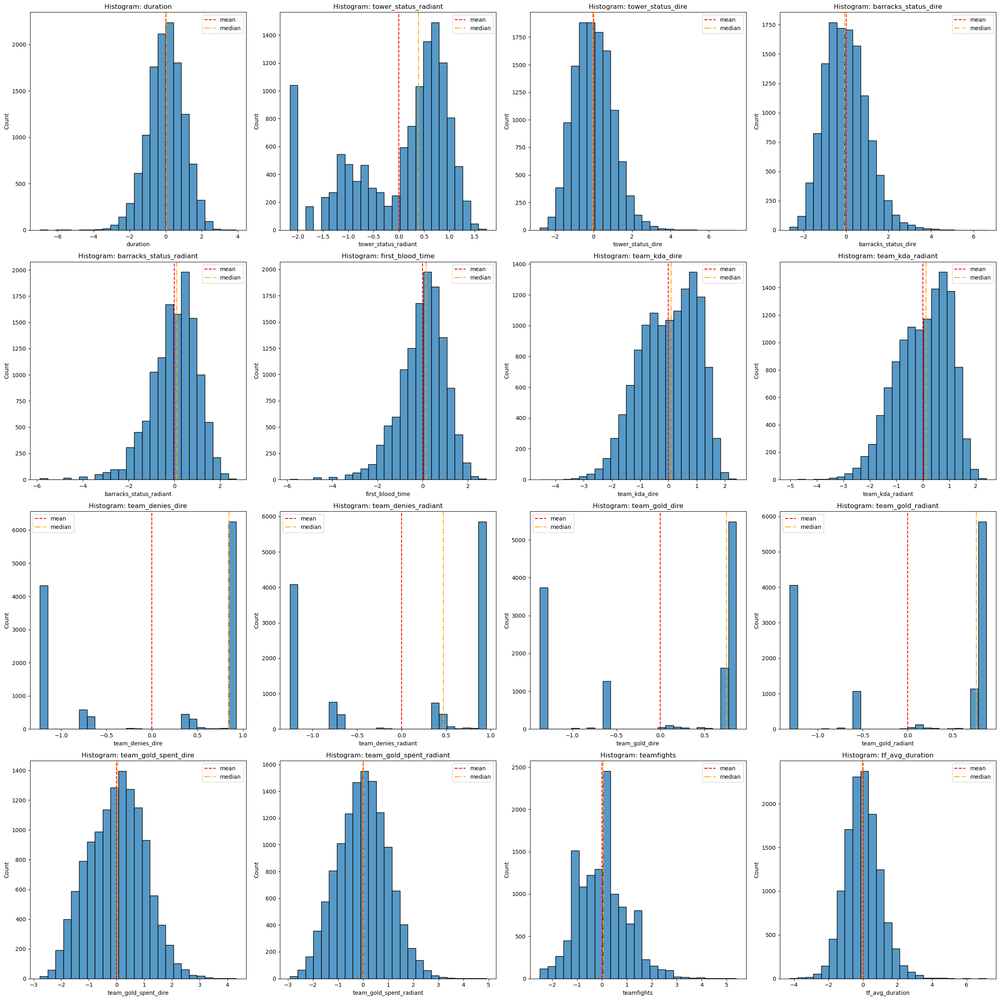

In [30]:
plt.subplots(4, 4, figsize=(25,25))

for idx, col in enumerate(sample_scaled.columns):
    plt.subplot(4, 4, idx+1)
    sns.histplot(sample_scaled[col], bins=25)
    plt.axvline(sample_scaled[col].mean(), label='mean', c='red', ls='--')
    plt.axvline(sample_scaled[col].median(), label='median', c='orange', ls='-.')
    plt.legend()
    plt.title(f'Histogram: {col}')

plt.tight_layout()
plt.show()

## Clustering

After preprocessing our data, we can begin analyzing the relationships within our dataset to discover clusters, with the aim of detecting patterns that distinguish well-balanced matches from the rest.

In [31]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score

In our exploration, we will delve into three different unsupervised model architectures: K-Means clustering, Agglomerative clustering, and Gaussian mixture models.

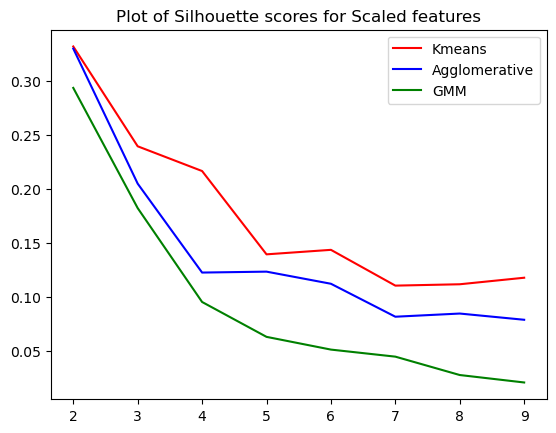

In [32]:
ks = np.arange(2, 10)

silScoresKmeans = []
silScoresAglom = []
silScoresGauss = []

for k in ks:
    
    print(f'Currently working on kmeans with k={k}', end='\x1b[1K\r')
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(sample_scaled)
    silScoresKmeans.append(silhouette_score(sample_scaled, kmeans.labels_))
    
    print(f'Currently working on AGG with k={k}', end='\x1b[1K\r')
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='ward')
    agglomerative.fit(sample_scaled)
    silScoresAglom.append(silhouette_score(sample_scaled, agglomerative.labels_))
    
    print(f'Currently working on GMM with k={k}', end='\x1b[1K\r')
    gmm = GaussianMixture(n_components=k)
    gmm.fit(sample_scaled)
    silScoresGauss.append(silhouette_score(sample_scaled, gmm.predict(sample_scaled)))

plt.figure()
plt.plot(ks, silScoresKmeans, label='Kmeans', color='red')
plt.plot(ks, silScoresAglom, label='Agglomerative', color='blue')
plt.plot(ks, silScoresGauss, label='GMM', color='green')
plt.title('Plot of Silhouette scores for Scaled features')
plt.legend()
plt.show()

In all three models, we were able to achieve the highest scores with two clusters. This outcome is quite promising as it aligns with our goal of distinguishing fair matches from unfair ones.

In [33]:
kmeans2 = KMeans(n_clusters=2)
kmeans2_labels = kmeans2.fit_predict(sample_scaled)

agglom2 = AgglomerativeClustering(n_clusters=2, linkage='ward')
agglom2_labels = agglom2.fit_predict(sample_scaled)

gmm2 = GaussianMixture(n_components=2)
gmm2_labels = gmm2.fit_predict(sample_scaled)

## PCA

Principal components are instrumental in interpreting the outcomes of unsupervised clustering algorithms. They allow for the transformation of correlated variables into a set of uncorrelated variables, making it easier to understand the structure of the data and identify underlying patterns or clusters. This can greatly aid in the interpretation and analysis of the results obtained from unsupervised clustering techniques.

In [34]:
from sklearn.decomposition import PCA

We are converting the data into three components to allow visualization in a 3D environment.

In [35]:
pca_m = PCA(n_components=3)
my_pca = pca_m.fit_transform(sample_scaled)

df_pca = pd.DataFrame(my_pca, index = sample_scaled.index, columns=[f'PC{i+1}' for i in range(3)])
df_pca.head()

,PC1,PC2,PC3
match_id,,,
47173,1.752488,0.986577,-0.373350
25845,-2.309530,2.092459,0.881663
27229,-1.425825,-0.177542,1.233656
31131,-2.548470,-0.732544,-1.181677
45872,-2.783311,-0.358451,0.400147


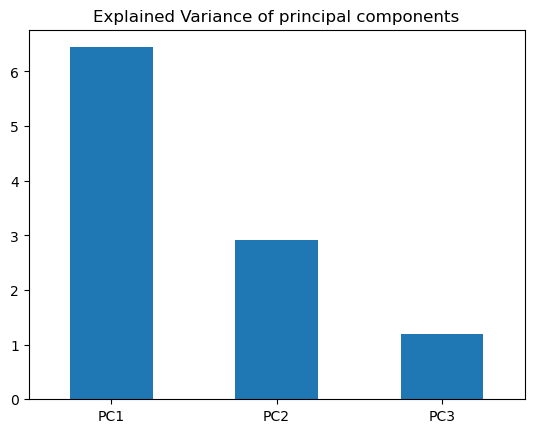

In [36]:
pd.Series(pca_m.explained_variance_, index=[f'PC{i+1}' for i in range(3)]).plot(kind='bar')
plt.xticks(rotation=0)
plt.title('Explained Variance of principal components')
plt.show()

As expected, the first principal component holds the most value from our features. Let's look into each of our coefficients:

In [37]:
loadings = pca_m.components_
loadings_df = pd.DataFrame(loadings, columns=list(sample_scaled.columns))
loadings_df.head()

,duration,tower_status_radiant,tower_status_dire,barracks_status_dire,barracks_status_radiant,first_blood_time,team_kda_dire,team_kda_radiant,team_denies_dire,team_denies_radiant,team_gold_dire,team_gold_radiant,team_gold_spent_dire,team_gold_spent_radiant,teamfights,tf_avg_duration
0,-0.061222,0.015119,-0.335858,0.334460,-0.072674,0.051507,-0.318299,0.299067,0.363296,-0.355519,-0.331306,0.345324,-0.240820,0.159149,-0.043769,-0.006397
1,0.554831,0.002543,-0.032636,-0.008615,0.059845,0.068382,0.096061,0.167433,0.006548,-0.072073,-0.071079,-0.003408,0.428040,0.500907,0.442805,0.070663
2,0.011023,0.458612,0.008929,0.016358,0.579063,0.610641,0.038817,0.025853,-0.013331,-0.007001,-0.014702,-0.021387,0.016295,0.025900,-0.266873,0.076006


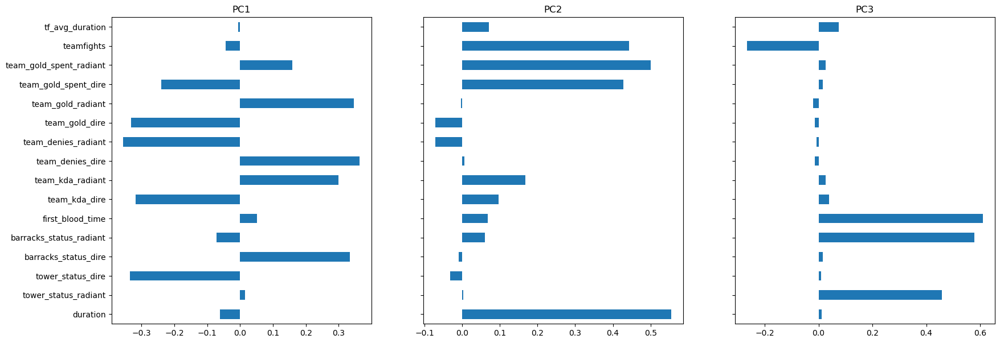

In [38]:
plt.subplots(1, 3, sharey=True, figsize=(20, 7))

plt.subplot(1, 3, 1)
loadings_df.iloc[0, :].plot(kind='barh')
plt.title('PC1')

plt.subplot(1, 3, 2)
loadings_df.iloc[1, :].plot(kind='barh')
plt.title('PC2')

plt.subplot(1, 3, 3)
loadings_df.iloc[2, :].plot(kind='barh')
plt.title('PC3')

plt.show()

It's interesting to see how the coefficients from our first component balance each other against the same feature from the opposing team. Let's go ahead and visualize the clusters from each model.

In [39]:
df_pca['kmeans2'] = kmeans2_labels
df_pca['agglom2'] = agglom2_labels
df_pca['gmm2'] = gmm2_labels

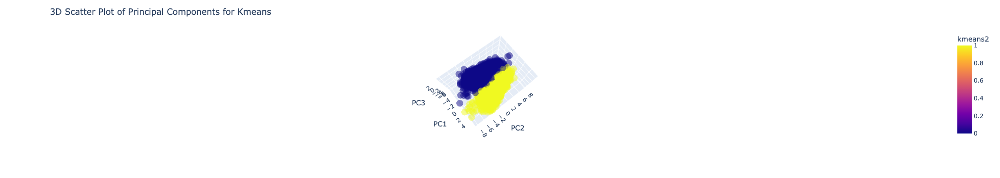

In [40]:
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', opacity=0.5, color='kmeans2')
fig.update_layout(title='3D Scatter Plot of Principal Components for Kmeans')
fig.show()

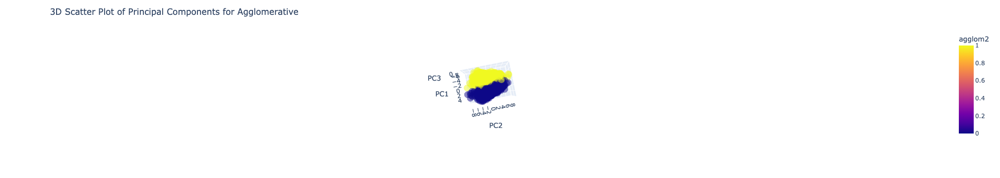

In [41]:
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', opacity=0.5, color='agglom2')
fig.update_layout(title='3D Scatter Plot of Principal Components for Agglomerative')
fig.show()

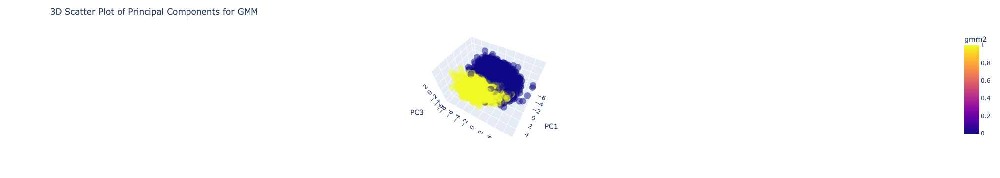

In [42]:
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', opacity=0.5, color='gmm2')
fig.update_layout(title='3D Scatter Plot of Principal Components for GMM')
fig.show()

## Conclusions

It seems that our attempt to identify hidden patterns in the data to determine if a match was balanced or not has grouped each match by the outcome (whether Radiant or Dire teams won). If we plan to pursue this approach, we may need to engage in more extensive feature engineering to prevent biasing the models based on the match outcomes.